In [1]:
import igraph
import networkx as nx

In [2]:
import pandas as pd
import numpy as np

import os

In [3]:
import pickle

In [4]:
def load_obj(folder, name):
    path = os.path.join(folder, name)
    try:
        with open(path, 'rb') as f:
            f = pickle.load(f)
    except EOFError:
        f = {"resend":True}
    return f

playerIdMap = load_obj('.', 'playerIdMap.pkl')

In [5]:
df = pd.read_csv("destinyMatches.csv").drop("teamId", axis=1)

In [6]:
df.shape

(42547, 147)

In [7]:
df.head(10)

,matchId,playerId,Medals_pvp_medal_ability_arc_beam,Medals_pvp_medal_ability_arc_staff_third,Medals_pvp_medal_ability_meteor_strike,Medals_pvp_medal_ability_sentinel_guard,Medals_pvp_medal_ability_thermal_knives,Medals_pvp_medal_ability_thermal_maul,Medals_pvp_medal_ability_void_blade,Medals_pvp_medal_ability_void_pulse,...,swordkills,team,teamScore,timePlayedSeconds,traceRifleId,traceRiflekills,weaponKillsAbility,weaponKillsGrenade,weaponKillsMelee,weaponKillsSuper
0,5865720629,4611686018467466246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,18.0,2.0,664.0,0.0,0.0,0.0,0.0,1.0,0.0
1,5865720629,4611686018467619295,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,18.0,2.0,666.0,0.0,0.0,0.0,0.0,1.0,2.0
2,5865720629,4611686018470650855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,18.0,2.0,664.0,0.0,0.0,0.0,0.0,0.0,2.0
3,5865720629,4611686018467284386,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,17.0,4.0,665.0,0.0,0.0,0.0,1.0,1.0,1.0
4,5865720629,4611686018470676402,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,17.0,4.0,665.0,0.0,0.0,0.0,0.0,0.0,1.0
5,5865720629,4611686018473976305,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,17.0,4.0,664.0,0.0,0.0,0.0,0.0,0.0,5.0
6,5865651624,4611686018467212096,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,18.0,4.0,536.0,0.0,0.0,0.0,0.0,2.0,0.0
7,5865651624,4611686018467403741,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,18.0,4.0,536.0,0.0,0.0,0.0,0.0,0.0,0.0
8,5865651624,4611686018471796498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,18.0,4.0,537.0,0.0,0.0,0.0,0.0,1.0,0.0
9,5865651624,4611686018467284386,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,17.0,1.0,536.0,0.0,0.0,0.0,1.0,1.0,1.0


In [8]:
for k in df.keys():
    if 'Id' in k:
        print(k)

matchId
playerId
autoRifleId
bowId
fireteamId
fusionRifleId
grenadeLauncherId
handCannonId
linearFusionRifleId
machineGunId
pulseRifleId
rocketLauncherId
scoutRifleId
shotgunId
sidearmId
sniperRifleId
subMachineGunId
swordId
traceRifleId


In [9]:
df.iloc[0]['pulseRifleId']

1161276682.0

In [10]:
df = df[:42541]

In [11]:
df.index

RangeIndex(start=0, stop=42541, step=1)

In [12]:
weaponNodes = []
for c in df.columns:
    if 'kills' in c and c not in ['kills', 'killsDeathsAssists', 'killsDeathsRatio']:
        weaponNodes.append(c)

In [13]:
weaponNodes.extend(["weaponKillsAbility", "weaponKillsGrenade", "weaponKillsMelee", "weaponKillsSuper"])

In [14]:
playerNodes = df['playerId'].unique()

In [15]:
df[df['playerId'].values == playerNodes[3]].iloc[3][weaponNodes[4]]

4.0

In [16]:
numPlayers = len(playerNodes)

In [17]:
idMap = {v: k + len(weaponNodes) for k, v in enumerate(playerNodes[:numPlayers])}

In [18]:
gunMap = {v:k for k, v in enumerate(weaponNodes)}

In [19]:
abbrev = {'bowkills':"bow",
 'fusionRiflekills':'FR',
 'grenadeLauncherkills':'GL',
 'handCannonkills':'HC',
 'linearFusionRiflekills':'LFR',
 'machineGunKills':'MG',
 'pulseRiflekills':'PR',
 'rocketLauncherkills':'RL',
 'scoutRiflekills':'SR',
 'shotgunkills':'Shot',
 'sidearmkills':'Side',
 'sniperRiflekills':'SR',
 'subMachineGunkills':'SMG',
 'swordkills':'sword',
 'traceRiflekills':'TR',
 'weaponKillsMelee':'Melee',
 'weaponKillsAbility':'Ab',
 'weaponKillsSuper':'Sup',
 'weaponKillsGrenade':'Gr', 
 'autoRiflekills':'AR',
 'machineGunkills':'MG'}

In [197]:
for k, v in abbrev.items():
    if len(k) < 10: 
        print(f"Full: {k} \t\t\t short: {v}")
    elif 10 <= len(k) < 18:
        print(f"Full: {k} \t\t short: {v}")
    else:
        print(f"Full: {k} \t short: {v}")

Full: bowkills 			 short: bow
Full: fusionRiflekills 		 short: FR
Full: grenadeLauncherkills 	 short: GL
Full: handCannonkills 		 short: HC
Full: linearFusionRiflekills 	 short: LFR
Full: machineGunKills 		 short: MG
Full: pulseRiflekills 		 short: PR
Full: rocketLauncherkills 	 short: RL
Full: scoutRiflekills 		 short: SR
Full: shotgunkills 		 short: Shot
Full: sidearmkills 		 short: Side
Full: sniperRiflekills 		 short: SR
Full: subMachineGunkills 	 short: SMG
Full: swordkills 		 short: sword
Full: traceRiflekills 		 short: TR
Full: weaponKillsMelee 		 short: Melee
Full: weaponKillsAbility 	 short: Ab
Full: weaponKillsSuper 		 short: Sup
Full: weaponKillsGrenade 	 short: Gr
Full: autoRiflekills 		 short: AR
Full: machineGunkills 		 short: MG


In [20]:
short = [v for k, v in abbrev.items()]

In [21]:
edges = []
personMax = {}

for pId, gId in idMap.items():
    # print(gId)
    playerMatches = df['playerId'].values == pId
    matchMaxes = []
    for rowId, row in df[playerMatches].iterrows():
        personalMatchMax = 0
        
        for c in weaponNodes:
            if row[c]:
                personalMatchMax += row[c]

        for c in weaponNodes:
            if row[c]:
                #personalMax += row[c]
                edges.append((pId, abbrev[c]))
                
        matchMaxes.append(personalMatchMax)
        
    personMax[pId] = np.mean(matchMaxes)

In [22]:
uniqueEdges = set()
for e in edges:
    uniqueEdges.add(e)

In [23]:
from collections import defaultdict

In [24]:
edgeCount = defaultdict(int)

for e in edges:
    edgeCount[e] += 1

In [25]:
weightedEdges = []
for e, w in edgeCount.items():
    weightedEdges.append((playerIdMap[e[0]]['name'], e[1], w)) # w / personMax[e[0]]

In [ ]:
from pprint import pprint

In [215]:
pprint(weightedEdges[:10])

[('3fitty7ven', 'PR', 180),
 ('3fitty7ven', 'Shot', 188),
 ('3fitty7ven', 'Melee', 132),
 ('3fitty7ven', 'Sup', 138),
 ('3fitty7ven', 'sword', 78),
 ('3fitty7ven', 'Gr', 78),
 ('3fitty7ven', 'HC', 16),
 ('3fitty7ven', 'SR', 18),
 ('3fitty7ven', 'AR', 8),
 ('3fitty7ven', 'RL', 1)]


In [27]:
#g.add_edges(edges[:500])

In [28]:
# visual_style = {}
# visual_style["vertex_label"] = g.vs["name"]
# visual_style['vertex_label_size'] = 3
# visual_style['vertex_size'] = 25

# layout = g.layout_reingold_tilford()
# igraph.plot(g, layout=layout, bbox=(1500, 200), **visual_style)

In [210]:
grenade = 0
for w in weightedEdges:
    if w[1] == 'Gr':
        grenade += 1

In [29]:
g2 = igraph.Graph.TupleList(weightedEdges, weights=True)

In [ ]:
#adj = g2.get_adjacency()

In [30]:
G = nx.Graph()
G.add_weighted_edges_from(weightedEdges)

# for g in G.nodes:
#     print(g)

# nx.drawing.layout.spectral_layout(G)

In [31]:
vnames = []
for i, e in enumerate(G.nodes):
    # print(e)
    if e in short:
        vnames.append(e)
        # print(e['name'])
    else:
        vnames.append('.')
    
g2.vs["name"] = vnames

In [ ]:
pnames = []
for i, e in enumerate(G.nodes):
    # print(e)
    if e in short:
        continue
        # pnames.append('.')
        # print(e['name'])
    else:
        pnames.append(e)
    
g2.vs["name"] = vnames

In [32]:
weight = []
for e in G.edges:
    weight.append(G.get_edge_data(*e)['weight'])
    
import seaborn as sb

import scipy as sp


# sb.distplot(weight, kde=False, fit=sp.stats.expon)

# sb.distplot(np.log(weight), kde=False, fit=sp.stats.expon)

normWeight = np.log(weight) / max(np.log(weight))

In [33]:
weights = normWeight + 0.25
for i, e in enumerate(G.edges):
    G.get_edge_data(*e)['weight'] = weights[i]

In [34]:
nodeColors = []

for n in G.nodes:
    if n in short:
        nodeColors.append('#42f2f5')
    else:
        nodeColors.append('#e968f2')

In [ ]:
nx.drawing.nx_pylab.draw_spring(G, node_color=nodeColors, node_size=30)

In [35]:
import matplotlib.pyplot as plt

/home/aadharna/miniconda3/envs/destiny/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 0, 'normalized ln(edgeWeight) + 0.25')

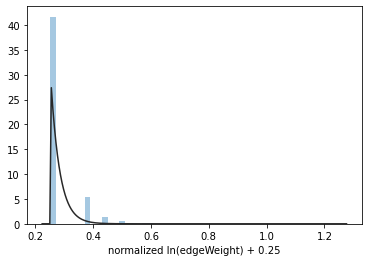

In [36]:
fig, ax = plt.subplots(1, 1)
sb.distplot(normWeight + 0.25, kde=False, fit=sp.stats.expon, ax=ax)
ax.set_xlabel("normalized ln(edgeWeight) + 0.25")

In [ ]:
visual_style = {}
visual_style["vertex_label"] = g2.vs["name"]
visual_style['vertex_label_size'] = 10
visual_style['vertex_label_color'] = 'blue'
visual_style['vertex_color'] = nodeColors
visual_style['vertex_size'] = 30
visual_style["edge_width"] = normWeight + 0.25

layout = g2.layout_reingold_tilford_circular()
image = igraph.plot(g2, layout=layout, bbox=(2500, 600), **visual_style)

# image.save(f'./weightedWeaponGraph.png')
image

In [198]:
cluster = g2.community_leading_eigenvector()

In [131]:
# foo = cluster.as_clustering(len(weaponNodes) // 2)

In [199]:
subs = cluster.membership

In [200]:
set(subs)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

In [201]:
colors = ['#ffd8b1', '#fabebe', '#008080', '#e6beff', 
          '#9a6324', '#fffac8', '#800000', '#aaffc3', 
          '#808000', '#bcf60c']

In [202]:
colors_named = ['peach', 'pink', 'teal', 'lilac',
                'brown', 'yellow', 'burgundy', 'mint',
                'olive', 'lime']

In [203]:
clusteredColors = [colors[i] for i in subs]

In [205]:
results = []
for i, n in enumerate(g2.vs['name']):
    if not n == '.':
        results.append((i, n, clusteredColors[i], colors_named[subs[i]]))

In [206]:
cdf = pd.DataFrame(sorted(results, key=lambda x: x[2]), columns=['i', 'name', 'hex', 'color'])

In [207]:
cdf1 = cdf.drop(['i', 'hex'], axis=1)

In [208]:
cdf1.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
name,Gr,SMG,Side,HC,SR,AR,sword,PR,Shot,Melee,Sup,RL,MG,GL,Ab,FR,TR,bow,LFR
color,teal,burgundy,brown,mint,mint,lilac,pink,peach,peach,peach,peach,peach,peach,peach,peach,peach,peach,peach,yellow


$$\mathcal{Q} := \frac{\textbf{s}^T \textbf{B} \textbf{s}}{4m}, \newline \text{where} \newline B := A_{ij} - \frac{k_i k_j}{2m}, \newline \text{where} \newline m := \frac{1}{2}\sum_i k_i \newline \text{and } k_d \text{ is the degree of a vertex}$$

In [209]:
visual_style = {}
visual_style["vertex_label"] = g2.vs["name"]
visual_style['vertex_label_size'] = 10
visual_style['vertex_label_color'] = 'blue'
visual_style['vertex_color'] = clusteredColors
visual_style['vertex_size'] = 30
visual_style["edge_width"] = normWeight

layout = g2.layout_reingold_tilford_circular()
image = igraph.plot(g2, layout=layout, bbox=(1000, 300), **visual_style)

image.save(f'./communityWeaponGraph.png')
image

In [ ]:
g2.diameter()

In [ ]:
visual_style = {}
visual_style['width'] = 30000
visual_style['height'] = 6000
visual_style['layout'] = 'reingold_tilford_circular'
visual_style["labels"] = g2.vs["name"]
# visual_style['vertex_label_size'] = 5
# visual_style['vertex_label_color'] = 'blue'
visual_style['colors'] = nodeColors
visual_style['vertex_size'] = 25
visual_style["edge_stroke_widths"] = weight * 2

#g2.write_svg("bigWeightedWeaponGraph.svg", **visual_style)

In [ ]:
# clustering = g2.clusters(mode='WEAK')

In [ ]:
# cg = clustering.cluster_graph()

In [ ]:
#visual_style = {}
#visual_style["vertex_label"] = g2.vs["name"]
#visual_style['vertex_label_size'] = 5
#visual_style['vertex_size'] = 25
#visual_style["edge_width"] = normWeight

# layout = cg.layout_reingold_tilford()
# image = igraph.plot(cg, layout=layout, bbox=(100, 100))#, **visual_style)

#image.save(f'./clusteredWeaponGraph.png')
# image

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
hist = list(g2.degree_distribution().bins())

In [ ]:
start, stop, value = zip(*hist)

Degree distiribution. 

i.e. how many weapon types is a person connected to throughout their play history?

In [ ]:
plt.bar(start[:15], value[:15])
plt.xlabel('edge count per node')
plt.ylabel('# nodes')

In [ ]:
eigenCentrality = g2.eigenvector_centrality()

In [ ]:
gunCentrality = [eigenCentrality[gunMap[w]] for w in sorted(weaponNodes)]

In [ ]:
from pprint import pprint

In [ ]:
pprint(list(zip(sorted(weaponNodes), gunCentrality)))

In [ ]:
plt.bar(range(len(weaponNodes)), gunCentrality)
plt.xticks(range(len(weaponNodes)), weaponNodes, rotation=90)
plt.xlabel("Weapon Node")
plt.ylabel("Node Centrality")